In [1]:
import numpy as np
import pandas as pd

from smartem.segmentation import segmenter, utils
from skimage import measure
from smartem.offline.train_mb_error_detector.NNtools import UNet

import h5py
import matplotlib.pyplot as plt
import torch
import numpy as np
# import pyvoi
# from smartem.offline.train_mb_error_detector.tools import VI
from smartem.offline.train_mb_error_detector import pyvoi
import pandas as pd
import seaborn as sns
import segmentation_models_pytorch as smp
from tqdm import tqdm
from skimage.segmentation import watershed
from skimage.feature import peak_local_max

from smartem.segmentation.utils import watershed as watershed_inhouse


# Set Variables and Models

In [2]:
checkpoint_folder = "/storage2/projects/smartEM/HybridGT_Models"
checkpoint_path = f"{checkpoint_folder}/unet_48_1.18e-01.pth"
data_path = "/storage2/projects/smartEM/em-vis/smartem-256-hybridgt-test.hdf5"
device = torch.device("cuda:1")
model = UNet.UNet(1,2)

# Define segmentation processing for testing different segmentations

In [23]:
def get_segmentation_output(data_path, Iseg, ignore_mem = False):

    data_dwts = []
    data_hdt_vois = []
    data_gt_vois = []

    with h5py.File(data_path, "r") as f:
        for reg in tqdm(f.keys()):
            group = f[reg]

            dwts = [int(dwt) for dwt in list(group.keys())]
            dwts.sort()
            slowest_dwt = dwts[-1]

            mask = group[f"{slowest_dwt}/mask"][()]
            # mask_flat = mask.flatten()
            gt_labels = measure.label(255 - mask)

            if gt_labels.shape[0] % 32 != 0:
                gt_labels = gt_labels[:-(gt_labels.shape[0] % 32), :]
            if mask.shape[0] % 32 != 0:
                    mask = mask[:-(mask.shape[0] % 32), :]
            
            # print("Before", gt_labels.shape)
            gt_labels = gt_labels[mask != 0]
            # print(gt_labels.shape)
            # 1200ns
            im = group[f"{slowest_dwt}/im"][()]
            hdt_labels = Iseg.get_labels(im)
            if ignore_mem:
                
                hdt_labels = hdt_labels[mask != 0]
                # exclude labels that are membranes
                # hdt_labels = hdt_labels * (mask == 0)
                # hdt_labels = hdt_labels[hdt_labels != 0]
                # hdt_labels_flat = hdt_labels.flatten()



            # all dwts
            for dwt in tqdm(group.keys()):
                im = group[f"{dwt}/im"][()]
                labels = Iseg.get_labels(im)

                if ignore_mem:

                    # gt_labels_flat = gt_labels.flatten()
                    # labels_flat = labels.flatten()

                    # valid_indices = np.where(mask_flat == 0)
                    # print(mask.shape, gt_labels.shape, labels.shape, hdt_labels.shape)
                    
                    labels = labels[mask != 0]
                    

                    # gt_labels_flat = gt_labels_flat[valid_indices]
                    # hdt_labels_flat = hdt_labels_flat[valid_indices]
                    # labels_flat = labels_flat[valid_indices]
                    # mask_low_res = Iseg.get_membranes(im)
                    # exclude labels that are membranes
                    # labels = labels * (mask == 0)
                    # gt_labels = gt_labels * (mask == 0)

                    # gt_labels = gt_labels[gt_labels != 0]
                    # labels = labels[labels != 0]

                    # print(gt_labels.shape, labels.shape, hdt_labels.shape)
                else:
                    gt_labels_flat = gt_labels.flatten()
                    labels_flat = labels.flatten()
                    hdt_labels_flat = hdt_labels.flatten()

                voi_gt,_,_ = pyvoi.VI(gt_labels,labels)
                voi_hdt,_,_ = pyvoi.VI(hdt_labels, labels)
                # voi_gt = VI(gt_labels.flatten(), labels.flatten())
                # voi_hdt= VI(hdt_labels.flatten(), labels.flatten())
                # print(voi_gt, voi_hdt)
                data_gt_vois.append(voi_gt.item())
                data_hdt_vois.append(voi_hdt.item())
                data_dwts.append(int(dwt))

    return data_dwts, data_hdt_vois, data_gt_vois
    

In [4]:

Iseg_cc = segmenter.Segmenter(checkpoint_path, segmenter_function = measure.label, device=device)
Iseg_cc.set_model(model_class=model)

data_dwts_cc, data_hdt_vois_cc, data_gt_vois_cc = get_segmentation_output(data_path, Iseg_cc, ignore_mem=False)



# data = {"Dwell Time (ns)": data_dwts, "Variation of Information from GT (nats)": data_gt_vois, "Variation of Information from 1200ns (nats)": data_hdt_vois}
# df = pd.DataFrame(data=data)

100%|██████████| 18/18 [02:40<00:00,  8.89s/it]


In [24]:

Iseg_cc = segmenter.Segmenter(checkpoint_path, segmenter_function = measure.label, device=device)
Iseg_cc.set_model(model_class=model)

data_dwts_cc_without_mem, data_hdt_vois_cc_without_mem, data_gt_vois_cc_without_mem = get_segmentation_output(data_path, Iseg_cc, ignore_mem=True)



# data = {"Dwell Time (ns)": data_dwts, "Variation of Information from GT (nats)": data_gt_vois, "Variation of Information from 1200ns (nats)": data_hdt_vois}
# df = pd.DataFrame(data=data)

  0%|          | 0/18 [00:00<?, ?it/s]

100%|██████████| 18/18 [02:07<00:00,  7.08s/it]


In [9]:
Iseg_watershed = segmenter.Segmenter(checkpoint_path, segmenter_function = watershed, device=device)
Iseg_watershed.set_model(model_class=model)

data_dwts_watershed, data_hdt_vois_watershed, data_gt_vois_watershed = get_segmentation_output(data_path, Iseg_watershed)

100%|██████████| 18/18 [05:22<00:00, 17.90s/it]


In [24]:
Iseg_watershed = segmenter.Segmenter(checkpoint_path, segmenter_function = watershed, device=device)
Iseg_watershed.set_model(model_class=model)

data_dwts_watershed_without_mem, data_hdt_vois_watershed_without_mem, data_gt_vois_watershed_without_mem = get_segmentation_output(data_path, Iseg_watershed, ignore_mem =True)

100%|██████████| 18/18 [06:51<00:00, 22.84s/it]


# Compare the two segmentations using a box plot

In [25]:
methods = ['Connected Components'] * len(data_dwts_cc_without_mem) + ['Watershed'] * len(data_dwts_watershed_without_mem)

data = {
    "Dwell Time (ns)": data_dwts_cc_without_mem + data_dwts_watershed_without_mem, 
    "Variation of Information from GT (nats)": data_gt_vois_cc_without_mem + data_gt_vois_watershed_without_mem, 
    "Segmentation Method": methods
}

df = pd.DataFrame(data=data)

plt.figure(figsize=(10, 6))
sns.boxplot(x="Dwell Time (ns)", y="Variation of Information from GT (nats)", hue="Segmentation Method", data=df)
plt.title("Variation of Information from GT for Connected Components and Watershed (Without Membranes)")
plt.show()

NameError: name 'data_dwts_watershed_without_mem' is not defined

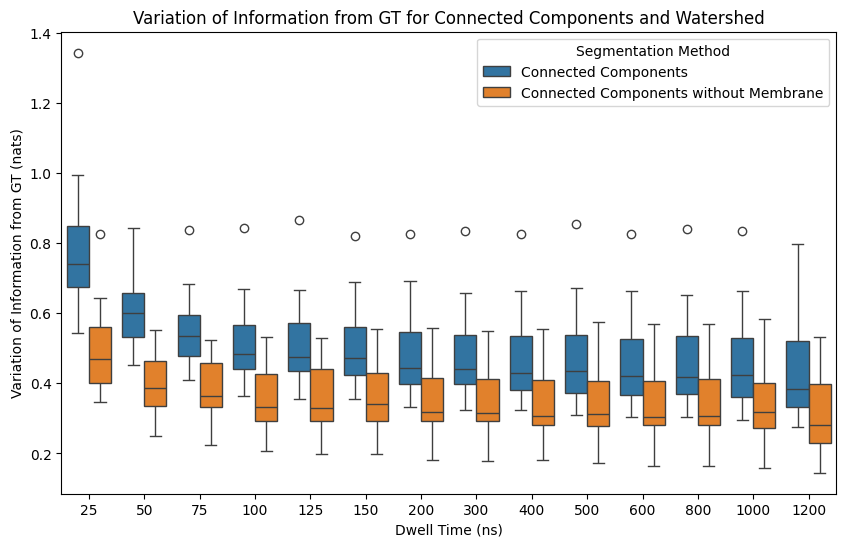

In [8]:
methods = ['Connected Components'] * len(data_dwts_cc) + ['Connected Components without Membrane'] * len(data_dwts_cc_without_mem)

data = {
    "Dwell Time (ns)": data_dwts_cc + data_dwts_cc_without_mem, 
    "Variation of Information from GT (nats)": data_gt_vois_cc + data_gt_vois_cc_without_mem, 
    "Segmentation Method": methods
}

df = pd.DataFrame(data=data)

plt.figure(figsize=(10, 6))
sns.boxplot(x="Dwell Time (ns)", y="Variation of Information from GT (nats)", hue="Segmentation Method", data=df)
plt.title("Variation of Information from GT for Connected Components and Watershed")
plt.show()

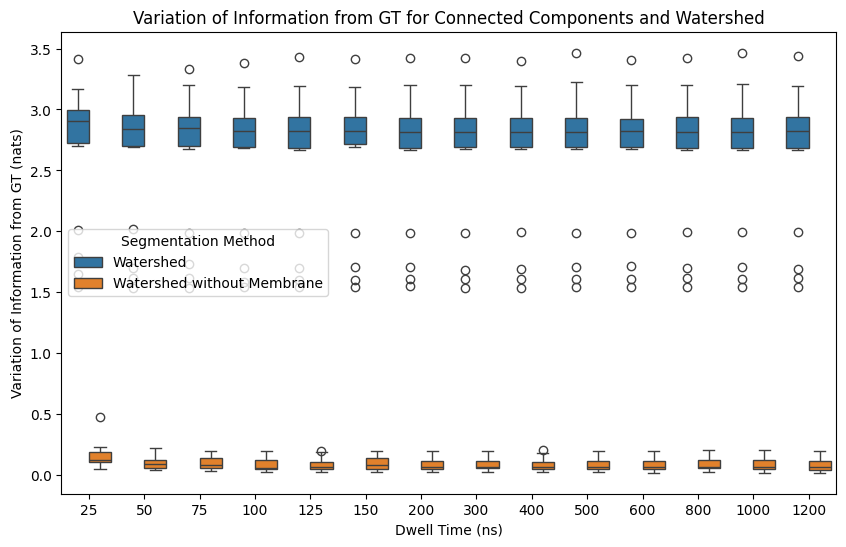

In [11]:
methods = ['Watershed'] * len(data_dwts_watershed) + ['Watershed without Membrane'] * len(data_dwts_watershed_without_mem)

data = {
    "Dwell Time (ns)": data_dwts_watershed + data_dwts_watershed_without_mem, 
    "Variation of Information from GT (nats)": data_gt_vois_watershed + data_gt_vois_watershed_without_mem, 
    "Segmentation Method": methods
}

df = pd.DataFrame(data=data)

plt.figure(figsize=(10, 6))
sns.boxplot(x="Dwell Time (ns)", y="Variation of Information from GT (nats)", hue="Segmentation Method", data=df)
plt.title("Variation of Information from GT for Connected Components and Watershed")
plt.show()

# EXAMPLES

In [16]:
def get_images(data_path, Iseg, selected_entry=2, ignore_mem=False):
    images = {}

    desired_dwts = [25, 50, 100, 400, 800, 1200]

    with h5py.File(data_path, "r") as f:
        reg = list(f.keys())[selected_entry]
        group = f[reg]

        dwts = [int(dwt) for dwt in list(group.keys())]
        dwts.sort()
        slowest_dwt = dwts[-1]
        
        mask = group[f"{slowest_dwt}/mask"][()]

        gt_labels = measure.label(255 - mask)
        if gt_labels.shape[0] % 32 != 0:
            gt_labels = gt_labels[:-(gt_labels.shape[0] % 32), :]
        
        if ignore_mem:
            if mask.shape[0] % 32 != 0:
                mask = mask[:-(mask.shape[0] % 32), :]
            gt_labels = gt_labels * (mask == 0)
        gt_labels_shuffled = utils.shuffle_labels(gt_labels)
        gt_labels_masked = np.ma.masked_where(gt_labels_shuffled == 0, gt_labels_shuffled)

        for dwt in desired_dwts:
            # print(dwt)
            im = group[f"{dwt}/im"][()]

            mask_low_res, mb_probs = Iseg.get_membranes(im, get_probs=True)
            labels = Iseg.get_labels(im)

            if ignore_mem:
                labels = labels * (mask_low_res == 0)

            labels_shuffled = utils.shuffle_labels(labels)
            labels_masked = np.ma.masked_where(labels_shuffled == 0, labels_shuffled)

            voi,_,_ = pyvoi.VI(gt_labels.flatten(), labels.flatten())
            title_stem = f"{dwt}ns_VOI_{voi.item():.2f}"

            images[title_stem + "_image"] = im
            images[title_stem + "_label"] = labels_masked
            images[title_stem + "_pred"] = mb_probs[0][1]
            
    images["ground_truth_image"] = im
    images["ground_truth_label"] = gt_labels_masked
    images["ground_truth_pred"] = mask
    images["high_dwell_time_image"] = im
    return images


## Connected Components Output

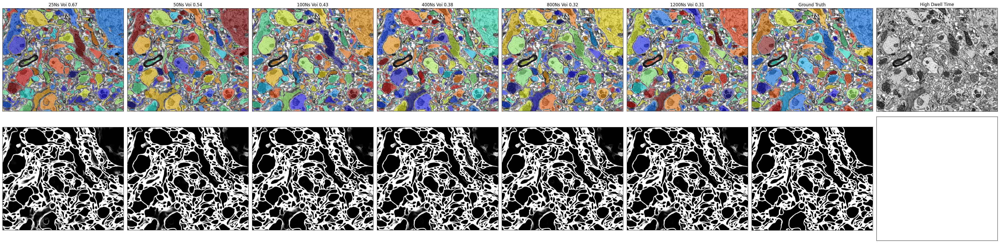

In [34]:
result_images_cc = get_images(data_path, Iseg_cc)
utils.visualize(**result_images_cc)

## Watershed Output

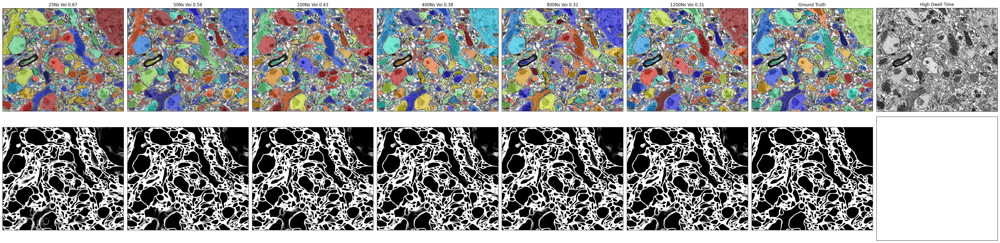

In [17]:
result_images_watershed = get_images(data_path, Iseg_watershed, ignore_mem=True)
utils.visualize(**result_images_watershed)